In [33]:
import matplotlib.pyplot as plt
import numpy as np

from scipy.optimize import minimize
%matplotlib inline

### Задание 1  
Дана матрица рейтингов фильмов (строки - пользователи (10 человек), столбцы - фильмы (15 фильмов))

##### a) Необходимо найти наиболее похожего пользователя по косинусной метрике для каждого из (ответ: 10 пар вида (x, y),  
##### где y - наиболее похожий пользователь на пользователя x).

In [2]:
raitings = np.array([[ 4,  4,  9,  4,  1,  6, 10,  7,  9,  6,  9,  2,  8,  6,  6],
                     [ 9,  2,  5, 10,  7,  8, 10,  5,  6,  2,  1,  6,  8,  9,  7],
                     [ 1,  6,  8,  8,  4,  9,  3,  8, 10,  5,  2,  6,  8,  1,  6],
                     [ 6,  1,  9,  7,  7,  9,  2,  3,  5,  1,  6,  6,  3,  2,  7],
                     [ 3,  7,  3,  5,  7,  9,  9,  6,  2,  9,  1,  2,  8, 10,  6],
                     [ 8,  3,  7,  3,  8,  6,  1,  8,  8,  6,  1,  9,  4, 10,  1],
                     [ 9,  8,  4,  8,  8, 10,  6,  1,  1,  2,  9,  5,  2,  7,  2],
                     [ 4,  1,  6,  4,  3, 10,  4,  4,  2,  8,  7,  9,  3,  8,  3],
                     [ 2,  7,  7,  6, 10,  6,  8,  9,  8,  6, 10,  1,  7, 10,  4],
                     [ 5, 10,  8,  8,  9,  7,  2,  9,  9, 10,  8,  8,  8,  6, 10]])

In [3]:
j=0
user = raitings[j]

data_for_company = np.delete(raitings,j,axis=0)
data_for_company

array([[ 9,  2,  5, 10,  7,  8, 10,  5,  6,  2,  1,  6,  8,  9,  7],
       [ 1,  6,  8,  8,  4,  9,  3,  8, 10,  5,  2,  6,  8,  1,  6],
       [ 6,  1,  9,  7,  7,  9,  2,  3,  5,  1,  6,  6,  3,  2,  7],
       [ 3,  7,  3,  5,  7,  9,  9,  6,  2,  9,  1,  2,  8, 10,  6],
       [ 8,  3,  7,  3,  8,  6,  1,  8,  8,  6,  1,  9,  4, 10,  1],
       [ 9,  8,  4,  8,  8, 10,  6,  1,  1,  2,  9,  5,  2,  7,  2],
       [ 4,  1,  6,  4,  3, 10,  4,  4,  2,  8,  7,  9,  3,  8,  3],
       [ 2,  7,  7,  6, 10,  6,  8,  9,  8,  6, 10,  1,  7, 10,  4],
       [ 5, 10,  8,  8,  9,  7,  2,  9,  9, 10,  8,  8,  8,  6, 10]])

In [4]:
def cosine(user, el ):
    """
    Подсчет косинуса угла между векторами a, b по их координатам
    """
    # длины векторов
    aLength = np.linalg.norm( user)
    bLength = np.linalg.norm( el )
    
    return np.dot( user, el ) / ( aLength * bLength )

In [5]:
j=0
for el in raitings:
    user = raitings[j]
    data_for_company = np.delete(raitings,j,axis=0)
    j  = j+1
    cosine_list = []
    for el in data_for_company:
        cosine_list.append(cosine(user,el))

    cosine_array = np.array(cosine_list)
    new_array = np.c_[data_for_company,cosine_array]
    sorted_array = sorted(new_array, key=lambda x : x[15],reverse = True)
    print("Пара",j)
    print("x", user)
    print("y", sorted_array[0][0:15])

Пара 1
x [ 4  4  9  4  1  6 10  7  9  6  9  2  8  6  6]
y [ 2.  7.  7.  6. 10.  6.  8.  9.  8.  6. 10.  1.  7. 10.  4.]
Пара 2
x [ 9  2  5 10  7  8 10  5  6  2  1  6  8  9  7]
y [ 3.  7.  3.  5.  7.  9.  9.  6.  2.  9.  1.  2.  8. 10.  6.]
Пара 3
x [ 1  6  8  8  4  9  3  8 10  5  2  6  8  1  6]
y [ 5. 10.  8.  8.  9.  7.  2.  9.  9. 10.  8.  8.  8.  6. 10.]
Пара 4
x [6 1 9 7 7 9 2 3 5 1 6 6 3 2 7]
y [ 5. 10.  8.  8.  9.  7.  2.  9.  9. 10.  8.  8.  8.  6. 10.]
Пара 5
x [ 3  7  3  5  7  9  9  6  2  9  1  2  8 10  6]
y [ 2.  7.  7.  6. 10.  6.  8.  9.  8.  6. 10.  1.  7. 10.  4.]
Пара 6
x [ 8  3  7  3  8  6  1  8  8  6  1  9  4 10  1]
y [ 5. 10.  8.  8.  9.  7.  2.  9.  9. 10.  8.  8.  8.  6. 10.]
Пара 7
x [ 9  8  4  8  8 10  6  1  1  2  9  5  2  7  2]
y [6. 1. 9. 7. 7. 9. 2. 3. 5. 1. 6. 6. 3. 2. 7.]
Пара 8
x [ 4  1  6  4  3 10  4  4  2  8  7  9  3  8  3]
y [ 8.  3.  7.  3.  8.  6.  1.  8.  8.  6.  1.  9.  4. 10.  1.]
Пара 9
x [ 2  7  7  6 10  6  8  9  8  6 10  1  7 10  4]
y [ 4.  4.  9.

##### b) Предположим, вы захотели сжать признаковые описания пользователя с 15 фильмов,  
до, скажем, 5-ти признаков, как вы это  сделаете?

С помощью PCA

In [6]:
import pandas as pd

from sklearn.decomposition import PCA

rand_state = 1000
pca_decomp = PCA(n_components = 5)

X_pca = pca_decomp.fit_transform(raitings)
X_pca = pd.DataFrame(X_pca)

X_pca

,0,1,2,3,4
0,-5.309861,1.929198,-4.933000,2.701880,5.504979
1,2.877634,2.716596,1.405928,7.263258,-4.503223
2,-4.940104,-6.688612,-0.945502,3.615567,-0.689693
3,5.149399,-6.280273,-4.659786,1.090240,-1.014711
4,-1.374887,7.543580,4.008344,2.128400,-0.163249
5,2.653420,-3.770756,8.584307,-1.466283,1.674018
6,8.615739,3.786033,-4.027210,-4.375826,-3.138803
7,5.396583,-1.017047,1.014567,-1.895128,6.548835
8,-5.784349,5.298571,-1.480836,-3.712955,0.213127
9,-7.283574,-3.517291,1.033188,-5.349152,-4.431280


### Задание 2
Вычислите производную $tg^2(sin(x) + cos(2x+3))$ в точке $x_0=1$ на python и на бумаге  
(просто подставить точку в производную и ничего не упрощать).

In [45]:
# from sympy import diff, symbols, cos, sin, tan
# x, y = symbols('x y')

# deriv = diff(tan(sin(x)+cos(2*x+3))**2)
# deriv

In [44]:
from scipy.misc import derivative
def f(x):
    return tan(sin(x)+cos(2*x+3))**2
derivative(f, 1.0, dx=1e-6)

55.3859176433136

In [ ]:
from IPython.display import Image

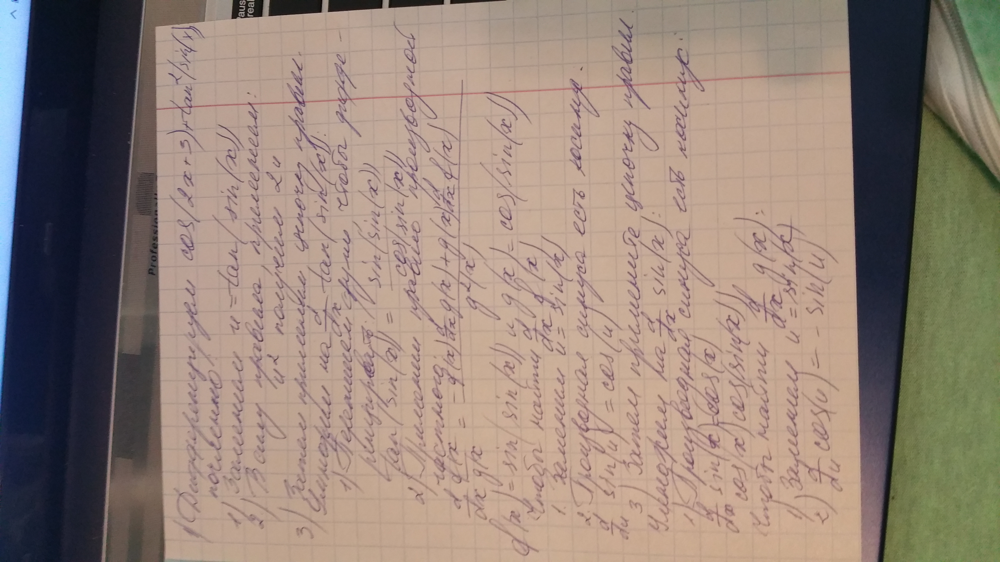

In [8]:
Image('D:\Python3\Mathematics\deriv.JPG')

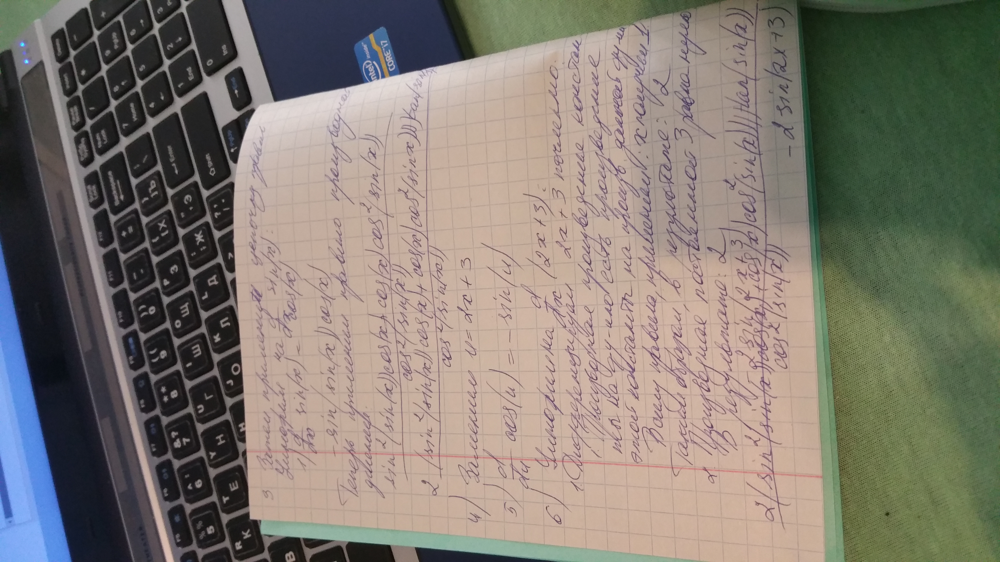

In [9]:
Image('D:\Python3\Mathematics\deriv_2.JPG')

### Задание 3
Дана функция с неизвестными параметрами a и b, вам также известны значения функции fx в точках x.  
Найдите оптимальные параметры a, b, минимизирующие абсолютную ошибку error

In [29]:
def f(x, a, b):
    return np.e**a * np.sin(b*x) + x

In [30]:
x = np.array([0.        , 0.26315789, 0.52631579, 0.78947368, 1.05263158,
              1.31578947, 1.57894737, 1.84210526, 2.10526316, 2.36842105,
              2.63157895, 2.89473684, 3.15789474, 3.42105263, 3.68421053,
              3.94736842, 4.21052632, 4.47368421, 4.73684211, 5.        ])

In [31]:
fx = np.array([  0.        , -12.01819092, -18.90968634, -17.68786571,
                -8.7529108 ,   4.27524517,  16.06801336,  21.81250213,
                19.22059845,   9.48411207,  -3.22273056, -13.48576488,
               -16.91096359, -11.95866834,  -0.58630088,  12.56873816,
                22.12489421,  24.20292139,  18.04522521,   6.33211092])

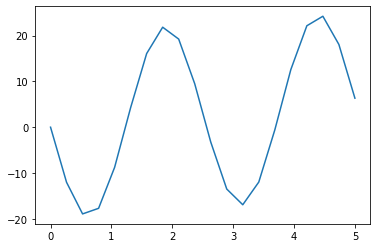

In [34]:
plt.plot(x, fx)
plt.show()

In [41]:
res = minimize(error, (0,0), method='COBYLA')

In [42]:
res.x

array([ 3.00018796, -2.50008926])

### Задание 4
Создайте собственную дискретную случайную величину с 20 значениями. Сгенерируйте 1000 выборок размера 50.  
Посчитайте среднее для каждой выборки. Постройте гистограмму распределения средних.

In [18]:
import numpy as np
import random

x = np.random.sample(20) 

mean_list = []
for i in range(1000):
    x1 = random.choices(x, k=50)
    z = np.mean(x1)
    mean_list.append(z)

# mean_list

(array([ 11.,  39., 103., 191., 227., 207., 131.,  63.,  23.,   5.]),
 array([0.3833398 , 0.40950297, 0.43566615, 0.46182932, 0.48799249,
        0.51415566, 0.54031883, 0.566482  , 0.59264518, 0.61880835,
        0.64497152]),
 <a list of 10 Patch objects>)

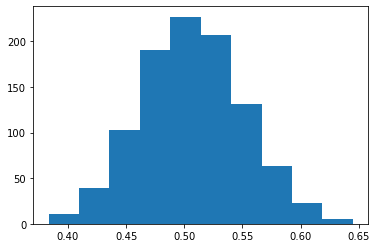

In [21]:
import matplotlib.pyplot as plt

plt.hist(mean_list)

### Задание 5
Найдите собственные значения и собственные вектора матрицы (на python и на бумаге)

[[1, 4],

[1, 1]]

In [24]:
matrix = np.mat ([[1, 4], [1, 1]])
w, v = np.linalg.eig (matrix)
print (w, "\n", v)

[ 3. -1.] 
 [[ 0.89442719 -0.89442719]
 [ 0.4472136   0.4472136 ]]


In [2]:
from IPython.display import Image

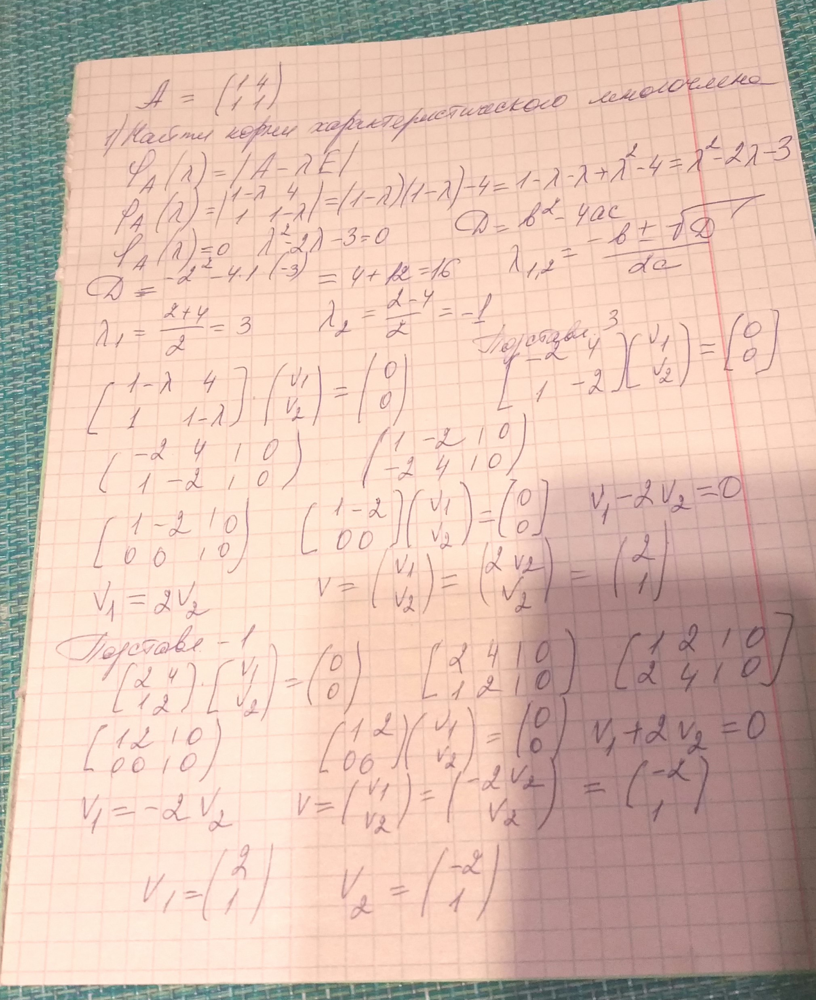

In [2]:
Image('D:\Python3\Mathematics\СобстЗначСобстВект.jpg')